# Generate simulation data from a PLRM

We simulate data from the following model:

$
y_i = \beta_0 + \beta_1 x_i + \beta_2 x_i \cdot \mathbb{I}(x_i > \alpha_1) + \beta_3 x_i \cdot \mathbb{I}(x_i > \alpha_2) + \epsilon_i^*
$

where the error term is defined as:

$
\epsilon_i^* = \left( \lvert x_i - \gamma_1 \rvert + \gamma_2 \right)^{-1} \cdot \epsilon_i, \quad \epsilon_i \sim t(\text{df})
$

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import t

# Parameters from the paper
beta_0 = 51.92
beta_1 = 4.41
beta_2 = -166.14
beta_3 = 274.00
alpha_1 = 0.26
alpha_2 = 0.49
gamma_1 = 0.35
gamma_2 = 0.10
dfs = (10, 15, 20)  # degrees of freedom for t-distribution

# Generate x values (AG: Agricultural Stressor)
sample_sizes = (30, 150)

def generate_x(sample_size):
    x = np.linspace(0.0351, 0.6698, sample_size)
    return x


def simulate_errors(sample_size, df, gamma_1 = 0.35, gamma_2 = 0.10):
    # Number of observations
    x = generate_x(sample_size)

    # Generate standard t-distributed errors
    e_i = t.rvs(df, size=sample_size) 

    # Generate heteroscedastic errors using the transformation
    error_scaling = np.abs(x - gamma_1) + gamma_2
    e_i_star = (1 / error_scaling) * e_i
    return e_i_star, e_i, error_scaling

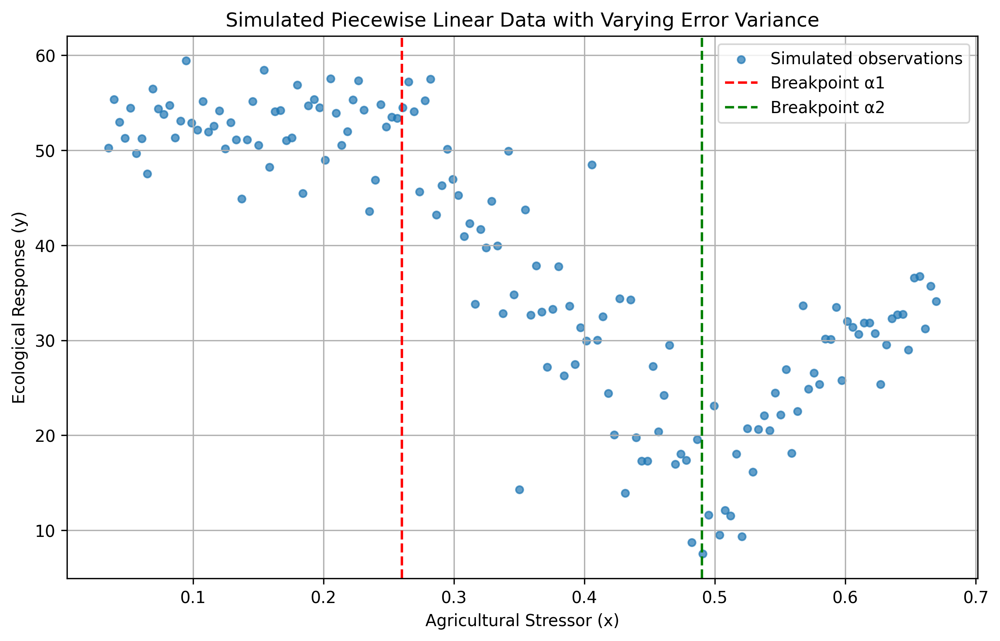

In [17]:
# Generate the simulated data
simulation_data = pd.DataFrame()

for sample_size in sample_sizes:
    for df in dfs:
        x = generate_x(sample_size)

        e_i_star, e_i, error_scaling = simulate_errors(sample_size, df, gamma_1, gamma_2)

        y = (beta_0 +
            beta_1 * x +
            beta_2 * x * (x > alpha_1) +
            beta_3 * x * (x > alpha_2) +
            e_i_star)
        
        y_continuous = (beta_0 +
            beta_1 * x +
            beta_2 * (x - alpha_1) * (x > alpha_1) +
            beta_3 * (x - alpha_2) * (x > alpha_2) +
            e_i_star)

        # Create DataFrame for inspection
        df_sim = pd.DataFrame({
            'x': x,
            'y': y,
            'y_continuous': y_continuous,
            'e_i': e_i,
            'e_i_star': e_i_star,
            'error_scaling': error_scaling,
            '(n, df)': f"({sample_size}, {df})",
        })
        simulation_data = pd.concat([simulation_data, df_sim], ignore_index=True)

# Plot the data for visualization
fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)
plt.scatter(x, y_continuous, alpha=0.7, s=20, label='Simulated observations')
plt.axvline(x=alpha_1, color='red', linestyle='--', label='Breakpoint α1')
plt.axvline(x=alpha_2, color='green', linestyle='--', label='Breakpoint α2')
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Simulated Piecewise Linear Data with Varying Error Variance')
plt.legend()
plt.grid(True)
plt.show()

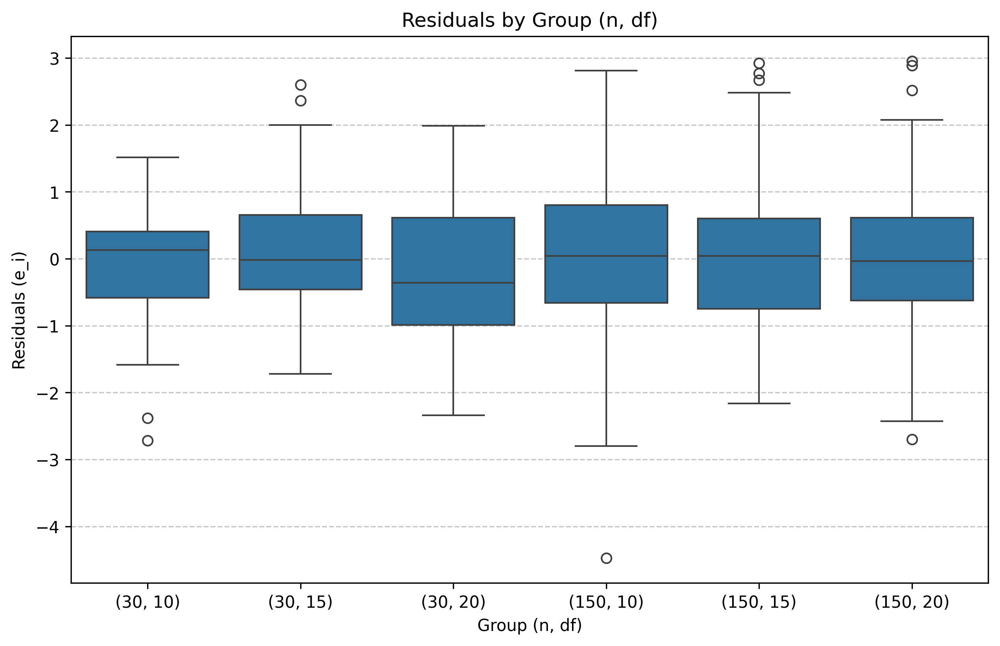

In [18]:
import seaborn as sns

# Create a boxplot for residuals (e_i) grouped by (n, df)
plt.figure(figsize=(10, 6), dpi = 300)
sns.boxplot(data=simulation_data, x='(n, df)', y='e_i')
plt.xlabel('Group (n, df)')
plt.ylabel('Residuals (e_i)')
plt.title('Residuals by Group (n, df)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Build the PQRM and construct CIs by bootstrapping

# Check data 

Starting from this point, use the **sample data of (n=30, df = 10)** for a quick check of the following code.

## Quantile Regression from Statsmodels 

https://www.statsmodels.org/dev/examples/notebooks/generated/quantile_regression.html

In [19]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

In [20]:
# Use simulation_data already in memory from earlier cells
# (no file I/O needed - data is already available from cell 2)
print(f"simulation_data shape: {simulation_data.shape}")

simulation_data shape: (540, 7)


In [21]:
# use the data of (30, 10) for a quick check of the model
df_check = simulation_data[simulation_data['(n, df)'] == '(30, 10)']
df_check.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, 0 to 29
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   x              30 non-null     float64
 1   y              30 non-null     float64
 2   y_continuous   30 non-null     float64
 3   e_i            30 non-null     float64
 4   e_i_star       30 non-null     float64
 5   error_scaling  30 non-null     float64
 6   (n, df)        30 non-null     object 
dtypes: float64(6), object(1)
memory usage: 1.9+ KB


In [22]:
# set quantile level as 0.8, build the model on x and y_continuous
model = smf.quantreg('y_continuous ~ x', data=df_check)
# fit the model
result = model.fit(q = 0.8)
print(result.summary())

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.3836
Model:                       QuantReg   Bandwidth:                       16.45
Method:                 Least Squares   Sparsity:                        31.34
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:02   Df Residuals:                       28
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     58.2443      5.286     11.018      0.000      47.416      69.073
x            -38.7664     13.367     -2.900      0.007     -66.147     -11.386


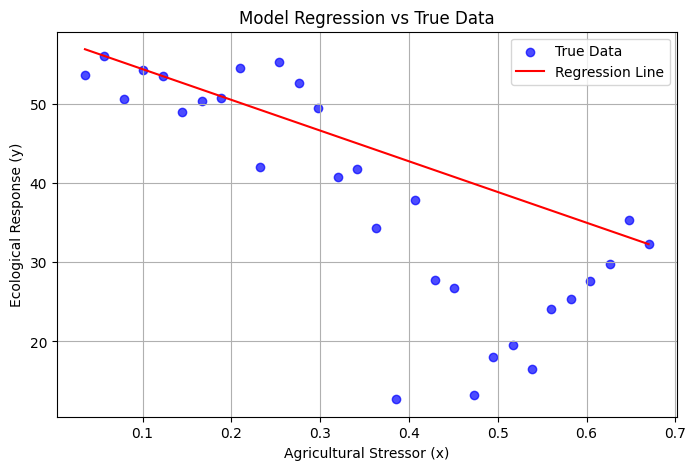

In [23]:
# Plot the true data
plt.figure(figsize=(8, 5))
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Data', color='blue')

# Plot the regression line
x_sorted = np.sort(df_check['x'])
y_pred = result.predict({'x': x_sorted})
plt.plot(x_sorted, y_pred, color='red', label='Regression Line')

# Add labels and legend
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Model Regression vs True Data')
plt.legend()
plt.grid(True)
plt.show()

# Add breakpoints parameter to the model

## Method 1 - Loop over alpha values to find and add a good breakpoint(Python)

In [24]:
import numpy as np

# Define check loss function
def check_loss(y_true, y_pred, tau):
    residuals = y_true - y_pred
    return np.sum(np.where(residuals >= 0, tau * residuals, (tau - 1) * residuals))

# Grid search over breakpoints
alphas = np.linspace(df_check['x'].min(), df_check['x'].max(), 100)
tau = 0.8
losses = []

for alpha in alphas:
    df_check.loc[:, 'x_break'] = (df_check['x'] - alpha).where(lambda x: x > 0, 0)
    model = smf.quantreg('y_continuous ~ x + x_break', data=df_check)
    result = model.fit(q=tau, max_iter=10000)
    y_pred = result.predict(df_check)
    loss = check_loss(df_check['y_continuous'], y_pred, tau)
    losses.append(loss)

# Find the best alpha
best_alpha = alphas[np.argmin(losses)]
print(f"Best breakpoint (alpha): {best_alpha:.4f}")

/var/folders/s5/r1s56_ps46lbbv1370hjn_vr0000gn/T/ipykernel_63541/4130717377.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_check.loc[:, 'x_break'] = (df_check['x'] - alpha).where(lambda x: x > 0, 0)


Best breakpoint (alpha): 0.5672


In [25]:
# put the breakpoint into the data
df_check.loc[:, 'x_break'] = (df_check['x'] - best_alpha).where(lambda x: x > 0, 0)
df_check[:5]

,x,y,y_continuous,e_i,e_i_star,error_scaling,"(n, df)",x_break
0,0.035100,53.671846,53.671846,0.662618,1.597055,0.414900,"(30, 10)",0.0
1,0.056986,56.022467,56.022467,1.513558,3.851158,0.393014,"(30, 10)",0.0
2,0.078872,50.639450,50.639450,-0.604336,-1.628377,0.371128,"(30, 10)",0.0
3,0.100759,54.255837,54.255837,0.660587,1.891491,0.349241,"(30, 10)",0.0
4,0.122645,53.489769,53.489769,0.336817,1.028905,0.327355,"(30, 10)",0.0


In [26]:
# make the quantile regression model with the breakpoint
model = smf.quantreg('y_continuous ~ x + x_break', data=df_check)
# fit the model
result = model.fit(q=tau, max_iter=10000)
print(result.summary())

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.4918
Model:                       QuantReg   Bandwidth:                       13.61
Method:                 Least Squares   Sparsity:                        27.95
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:03   Df Residuals:                       27
                                        Df Model:                            2
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.8473      3.896     18.698      0.000      64.853      80.841
x            -87.1043     11.342     -7.680      0.000    -110.376     -63.833
x_break      234.0735    110.328      2.122      0.043       7.700     460.447


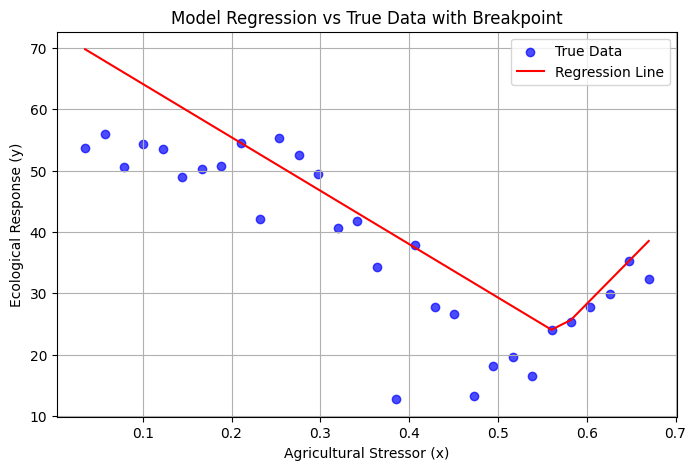

In [27]:
# Plot the true data
plt.figure(figsize=(8, 5))
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Data', color='blue')

# Plot the regression line
x_sorted = np.sort(df_check['x'])
x_break_sorted = np.sort(df_check["x_break"])
y_pred = result.predict({'x': x_sorted, 'x_break': x_break_sorted})
plt.plot(x_sorted, y_pred, color='red', label='Regression Line')
# Add labels and legend
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Model Regression vs True Data with Breakpoint')
plt.legend()
plt.grid(True)
plt.show()

It might be worth to try how to find n breakpoints by looping over a grid of alpha values, it can be left for 
future work.

## Method 2 - Use R libaries to add breakpoints

### No searching for breakpoints, only adding them manually

In [28]:
# Note: R examples below are for reference
# To run R code, install rpy2 and configure the notebook for %%R magic
# For now, using Python equivalents with statsmodels for quantile regression

print("R libraries would be loaded here with rpy2 installed")
print("Using Python statsmodels for quantile regression instead")

R libraries would be loaded here with rpy2 installed
Using Python statsmodels for quantile regression instead


                         QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:              0.09639
Model:                       QuantReg   Bandwidth:                      0.7252
Method:                 Least Squares   Sparsity:                        3.510
Date:                Wed, 14 Jan 2026   No. Observations:                  150
Time:                        21:27:04   Df Residuals:                      147
                                        Df Model:                            2
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     1.2651      0.342      3.703      0.000       0.590       1.940
x                             5.5253      1.249      4.423      0.000       3.057       7.994
I(np.maximum(x - 0.4, 0))    -9.1919      1.816     -5.062      0.000  

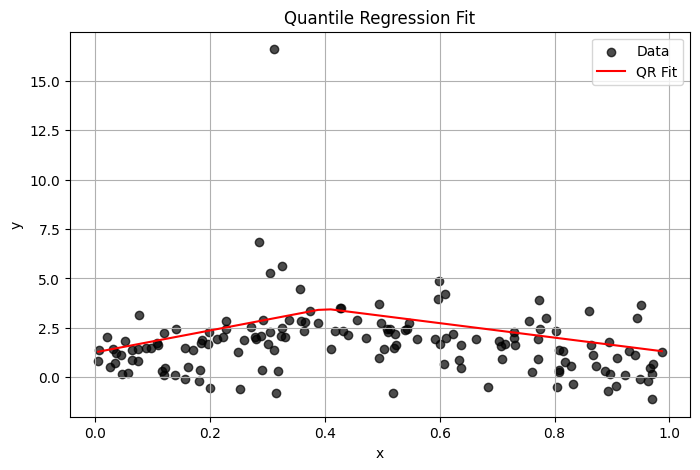

In [29]:
# Python version: Generate sample data for demonstration with statsmodels quantile regression
np.random.seed(42)
n = 150
x_demo = np.sort(np.random.uniform(0, 1, n))
y_demo = 1 + 3 * x_demo - 5 * np.maximum(x_demo - 0.4, 0) + np.random.standard_t(5, n)
data_demo = pd.DataFrame({'x': x_demo, 'y': y_demo})

# Fit quantile regression model
tau_demo = 0.8  # Quantile level
model_demo = smf.quantreg('y ~ x + I(np.maximum(x - 0.4, 0))', data=data_demo)
result_demo = model_demo.fit(q=tau_demo)

# Summary of the quantile regression model
print(result_demo.summary())

# Plot the data and quantile regression fit
plt.figure(figsize=(8, 5))
plt.scatter(data_demo['x'], data_demo['y'], alpha=0.7, label='Data', color='black')
x_pred = np.sort(data_demo['x'].values)
pred_df_demo = pd.DataFrame({'x': x_pred, 'np.maximum(x - 0.4, 0)': np.maximum(x_pred - 0.4, 0)})
y_pred_demo = result_demo.predict(pred_df_demo)
plt.plot(x_pred, y_pred_demo, color='red', label='QR Fit')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Quantile Regression Fit')
plt.legend()
plt.grid(True)
plt.show()

In [30]:
# Python version: Filter for sample (30, 10) data from memory
df_check_r = simulation_data[simulation_data['(n, df)'] == '(30, 10)'].copy()

# Display first few rows
print(df_check_r.head(5))
print(f'Data dimensions: {df_check_r.shape[0]} x {df_check_r.shape[1]}')

          x          y  y_continuous       e_i  e_i_star  error_scaling  \
0  0.035100  53.671846     53.671846  0.662618  1.597055       0.414900   
1  0.056986  56.022467     56.022467  1.513558  3.851158       0.393014   
2  0.078872  50.639450     50.639450 -0.604336 -1.628377       0.371128   
3  0.100759  54.255837     54.255837  0.660587  1.891491       0.349241   
4  0.122645  53.489769     53.489769  0.336817  1.028905       0.327355   

    (n, df)  
0  (30, 10)  
1  (30, 10)  
2  (30, 10)  
3  (30, 10)  
4  (30, 10)  
Data dimensions: 30 x 7


                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.6878
Model:                       QuantReg   Bandwidth:                       6.927
Method:                 Least Squares   Sparsity:                        13.63
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:04   Df Residuals:                       26
                                        Df Model:                            3
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     56.1708      4.043     13.894      0.000      47.861      64.481
x            -28.8703     19.478     -1.482      0.150     -68.907      11.167
x_break1     -99.0047     33.783     -2.931      0.007    -168.446     -29.563
x_break2     341.6533     66.107      5.168      0.0

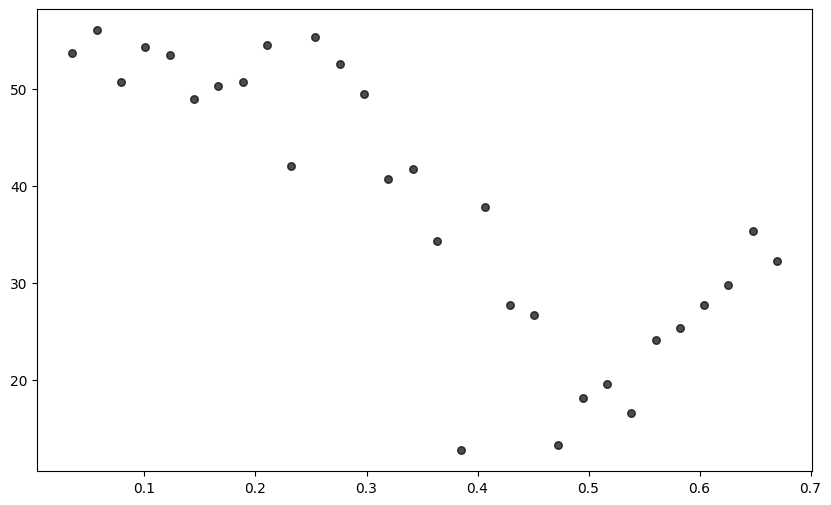

In [31]:
# Python version: Fit a Piecewise Quantile Regression Model (PQRM) on the simulated data
if df_check_r is None or len(df_check_r) == 0:
    print('df_check_r data not available. Please run Python import cell first.')
else:
    tau = 0.5
    try:
        # Create breakpoint variables
        df_check_r_copy = df_check_r.copy()
        df_check_r_copy['x_break1'] = (df_check_r_copy['x'] - 0.2950).apply(lambda x: max(x, 0))
        df_check_r_copy['x_break2'] = (df_check_r_copy['x'] - 0.5544).apply(lambda x: max(x, 0))
        
        # Fit PQRM using statsmodels
        model_r = smf.quantreg('y_continuous ~ x + x_break1 + x_break2', data=df_check_r_copy)
        qr_fit_r = model_r.fit(q=tau)
        
        # Summary of the quantile regression model
        print(qr_fit_r.summary())
        
        # Plot the data with fitted model
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.scatter(df_check_r_copy['x'], df_check_r_copy['y_continuous'], alpha=0.7, label='Data', color='black', s=30)
        
        # Predict on sorted x values
        x_sorted = np.linspace(df_check_r_copy['x'].min(), df_check_r_copy['x'].max(), 100)
        x_break1_sorted = (x_sorted - 0.2950).clip(min=0)
        x_break2_sorted = (x_sorted - 0.5544).clip(min=0)
        pred_df_r = pd.DataFrame({'x': x_sorted, 'x_break1': x_break1_sorted, 'x_break2': x_break2_sorted})
        pred_values_r = qr_fit_r.predict(pred_df_r)
        
        ax.plot(x_sorted, pred_values_r, color='red', lwd=2, label='PQRM Fit')
        
        # Add breakpoint lines
        ax.axvline(x=0.2950, color='blue', linestyle='--', lwd=1, label='Breakpoint 1')
        ax.axvline(x=0.5544, color='orange', linestyle='--', lwd=1, label='Breakpoint 2')
        
        ax.set_xlabel('Agricultural Stressor (x)', fontsize=12)
        ax.set_ylabel('Ecological Response (y)', fontsize=12)
        ax.set_title(f'Piecewise Quantile Regression Fit (tau = {tau})', fontsize=14, fontweight='bold')
        ax.legend(loc='upper left')
        ax.grid(True, linestyle='--', alpha=0.6)
        plt.show()
        
        print('PQRM fit completed successfully')
    except Exception as e:
        print(f'Error in PQRM fitting: {str(e)}')

If there is no packages in R to automatically find breakpoints, but only building loops over a grid to 
find them by iteration, i am moer familiar with Python, so i will design that process in Python.

# Try Scipy to find the best breakpoints by optimization

In [32]:
import numpy as np
import statsmodels.formula.api as smf
from scipy.optimize import minimize
import matplotlib.pyplot as plt
import pandas as pd

In [33]:
# Use simulation_data already in memory from earlier cells
# Filter for (30, 10) sample for the optimization example
df_check = simulation_data[simulation_data['(n, df)'] == '(30, 10)'].copy()
print(df_check.head())

          x          y  y_continuous       e_i  e_i_star  error_scaling  \
0  0.035100  53.671846     53.671846  0.662618  1.597055       0.414900   
1  0.056986  56.022467     56.022467  1.513558  3.851158       0.393014   
2  0.078872  50.639450     50.639450 -0.604336 -1.628377       0.371128   
3  0.100759  54.255837     54.255837  0.660587  1.891491       0.349241   
4  0.122645  53.489769     53.489769  0.336817  1.028905       0.327355   

    (n, df)  
0  (30, 10)  
1  (30, 10)  
2  (30, 10)  
3  (30, 10)  
4  (30, 10)  


## Define a PQRM with one breakpoint

In [34]:
# 1. Define the loss function to minimize
def quantreg_loss(alpha, tau=0.5, data = df_check):
    # a hinge function to introduce the breakpoint
    df_check.loc[:, 'x_break'] = np.maximum(df_check['x'] - alpha[0], 0) # scipy uses args as a sequence
    model = smf.quantreg('y_continuous ~ x + x_break', data=data)
    result = model.fit(q=tau)
    
    # Option 1: minimize the check loss (sum of residuals)
    residuals = data['y_continuous'] - result.predict(df_check)
    check_loss = np.sum(np.where(residuals >= 0, tau * residuals, (tau - 1) * residuals))
    
    return check_loss

In [35]:
# try to find the optimal alpha using scipy.optimize.minimize function
res = minimize(quantreg_loss, x0=[0.5], bounds=[(df_check['x'].min(), df_check['x'].max())])
print("Optimal alpha:", res.x[0])
print("Minimum loss:", res.fun)

Optimal alpha: 0.5318738615675387
Minimum loss: 67.42392953208935


In [36]:
# Define a function to creat the PQRM with that alpha
def fit_pqrm_with_alpha(alpha, tau=0.5, data = df_check):
    data.loc[:, 'x_break'] = np.maximum(data['x'] - alpha, 0)
    model = smf.quantreg('y_continuous ~ x + x_break', data=data)
    result = model.fit(q=tau)
    return result

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.6389
Model:                       QuantReg   Bandwidth:                       7.294
Method:                 Least Squares   Sparsity:                        15.45
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:04   Df Residuals:                       27
                                        Df Model:                            2
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     62.9525      3.329     18.911      0.000      56.122      69.783
x            -80.4303      9.983     -8.057      0.000    -100.913     -59.947
x_break      182.6246     50.882      3.589      0.001      78.223     287.026


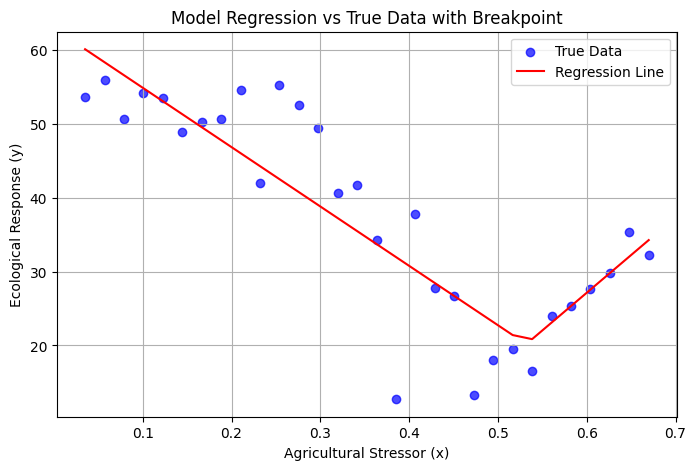

In [37]:
# Use the optimal alpha to fit the PQRM on the checked data
checked_result = fit_pqrm_with_alpha(res.x[0], tau=0.5, data=df_check)
print(checked_result.summary())

# Plot the true data
plt.figure(figsize=(8, 5))
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Data', color='blue')
# Plot the regression line
x_sorted = np.sort(df_check['x'])
x_break_sorted = np.sort(df_check["x_break"])
y_pred = checked_result.predict({'x': x_sorted, 'x_break': x_break_sorted})
plt.plot(x_sorted, y_pred, color='red', label='Regression Line')
# Add labels and legend
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Model Regression vs True Data with Breakpoint')
plt.legend()
plt.grid(True)
plt.show()

# Define a PQRM with two breakpoints

In [38]:
# 1. Define the loss function to minimize
def quantreg_loss(alphas, tau=0.5, data = df_check):
    # a hinge function to introduce the breakpoint
    formula_x = ''
    for i, alpha in enumerate(alphas):
        data.loc[:, f'x_break{i+1}'] = np.maximum(data['x'] - alpha, 0)
        formula_x += f'x_break{i+1} + '
    formula_x = formula_x.rstrip(' + ') # remove the trailing " + "
    
    model = smf.quantreg(f'y_continuous ~ x + {formula_x}', data=data)
    result = model.fit(q=tau)
    # Option 1: minimize the check loss (sum of residuals)
    residuals = df_check['y_continuous'] - result.predict(data)
    loss = np.sum(np.where(residuals >= 0, tau * residuals, (tau - 1) * residuals))
    
    return loss

In [39]:
# try to find the optimal alpha using scipy.optimize.minimize function
res = minimize(quantreg_loss, x0=[0.3, 0.5], bounds=[(0.2, 0.35), (0.4, 0.6)])
print("Optimal alpha:", res.x[:2])
print("Minimum loss:", res.fun)

Optimal alpha: [0.27584827 0.49014834]
Minimum loss: 45.07243773725788


In [40]:
# Define a function to creat the PQRM with alphas
def fit_pqrm_with_alphas(alphas, tau=0.5, data = df_check):
    formula_x = ""
    for i, alpha in enumerate(alphas):
        data.loc[:, f'x_break{i+1}'] = np.maximum(data['x'] - alpha, 0)
        formula_x += f'x_break{i+1} + '
    formula_x = formula_x.rstrip(' + ')
    model = smf.quantreg(f'y_continuous ~ x + {formula_x}', data=data)
    result = model.fit(q=tau)
    return result 

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.7586
Model:                       QuantReg   Bandwidth:                       4.482
Method:                 Least Squares   Sparsity:                        9.307
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:06   Df Residuals:                       26
                                        Df Model:                            3
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     53.8289      2.894     18.597      0.000      47.879      59.779
x             -4.4747     14.986     -0.299      0.768     -35.280      26.330
x_break1    -161.3466     26.949     -5.987      0.000    -216.742    -105.952
x_break2     258.9491     33.225      7.794      0.0

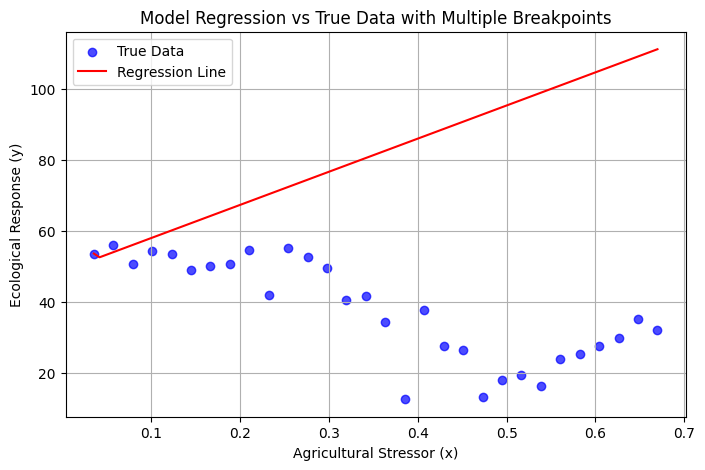

In [41]:
# Use the optimal alphas to fit the PQRM on the checked data
result = fit_pqrm_with_alphas(res.x[:2], tau=0.5, data=df_check)
print(result.summary())

# visualize the result
plt.figure(figsize=(8, 5))
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Data', color='blue')
# Plot the regression line
# Use the continue predictor values in the space to predict
x_sorted = np.linspace(df_check['x'].min(), df_check['x'].max(), 1000)
x_break_sorted = [np.maximum(x_sorted - alpha, 0) for alpha in alphas]

y_pred = result.predict({'x': x_sorted, **{f'x_break{i+1}': x_break_sorted[i] for i in range(len(x_break_sorted))}})
plt.plot(x_sorted, y_pred, color='red', label='Regression Line')
# Add labels and legend
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Model Regression vs True Data with Multiple Breakpoints')
plt.legend()
plt.grid(True)
plt.show()

Now, i got components for building an **PQRM pipline** that automatically finds the optimal parameters. 

This pipline receives a dataset and two initial breakpoint values(could be with boundaries for the optimization),
and returns a PQRM with optimal parameters, including the two breakpoints.

Using this pipline, if i make **bootstrap on the original dataset**, i can get an empirical distribution of the PQRM parameters, and then calculate the CIs for them.

# Integrate the PQRM pipeline

In [42]:
# Define a function to creat the PQRM with alphas
def fit_pqrm_with_alphas(alphas, tau=0.5, data = df_check, max_iter = 5000):
    data = data.copy()  # Avoid modifying the original DataFrame
    formula_x = ""
    for i, alpha in enumerate(alphas):
        data.loc[:, f'x_break{i+1}'] = np.maximum(data.loc[:, 'x'] - alpha, 0)
        formula_x += f'x_break{i+1} + '
    formula_x = formula_x.rstrip(' + ')
    model = smf.quantreg(f'y_continuous ~ x + {formula_x}', data=data)
    result = model.fit(q=tau, max_iter= max_iter)
    return result, data

In [43]:
# PQRM pipline
def pqrm_pipeline(data, tau=0.5, max_breakpoints=2, response_variable = "y_continuous", x = "x", initial_guess = None, bounds=None, max_iter = 5000):
    """
    Fit a Piecewise Quantile Regression Model (PQRM) to the data.
    
    This function return includes a new dataframe that adds the breakpoints as new columns on top of the 
    given data. This new dataframe is necessary for using the fitted model to predict new data.
    
    Parameters:
    - data: DataFrame containing 'x' and 'y_continuous'.
    - tau: Quantile level for regression.
    - max_breakpoints: Maximum number of breakpoints to consider.
    
    Returns:
    - result: Fitted model result.
    - alphas: Optimal breakpoints found.
    """
    # Define the loss function to minimize(better writing it here for clarity)
    def quantreg_loss(alphas, tau=0.5, data = data):
    # a hinge function to introduce the breakpoint
        data_copy = data.copy()  # avoid modifying the original data
        formula_x = ''
        for i, alpha in enumerate(alphas):
            data_copy.loc[:, f'{x}_break{i+1}'] = np.maximum(data_copy.loc[:, x] - alpha, 0)
            formula_x += f'{x}_break{i+1} + '
        formula_x = formula_x.rstrip(' + ') # remove the trailing " + "
        
        model = smf.quantreg(f'{response_variable} ~ {x} + {formula_x}', data=data_copy)
        result = model.fit(q=tau, max_iter= max_iter)
        # Option 1: minimize the check loss (sum of residuals)
        residuals = data_copy[f'{response_variable}'] - result.predict(data_copy)
        loss = np.sum(np.where(residuals >= 0, tau * residuals, (tau - 1) * residuals))
        
        return loss
    
    # Initial guess for breakpoints
    if initial_guess is None:
        initial_guess = np.linspace(data[x].min(), data[x].max(), max_breakpoints)
    else:
        initial_guess = np.array(initial_guess)
    
    # Initial boundaries for the breakpoints
    if bounds is None:
        # split the range of x into n equal segments for n breakpoints
        n = range(1, max_breakpoints + 1)
        min_x = float(data[x].min())
        max_x = float(data[x].max())
        segment_length = (max_x - min_x) / len(n)
        bounds = [(min_x + (i-1) * segment_length, min_x + i * segment_length) for i in n]
    else:
        bounds = bounds
        
    # Optimize breakpoints
    res = minimize(quantreg_loss, x0 = initial_guess, bounds = bounds)
    
    # Fit the final model with optimal breakpoints
    result, data = fit_pqrm_with_alphas(res.x, tau=tau, data=data)
    
    return result, res.x, data

Optimal breakpoints: [0.27584826 0.49014825]
                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.7586
Model:                       QuantReg   Bandwidth:                       4.482
Method:                 Least Squares   Sparsity:                        9.307
Date:                Wed, 14 Jan 2026   No. Observations:                   30
Time:                        21:27:10   Df Residuals:                       26
                                        Df Model:                            3
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     53.8289      2.894     18.597      0.000      47.879      59.779
x             -4.4747     14.986     -0.299      0.768     -35.280      26.330
x_break1    -161.3467     26.949     -5.987      0.000    -216.742    -105.952
x_break

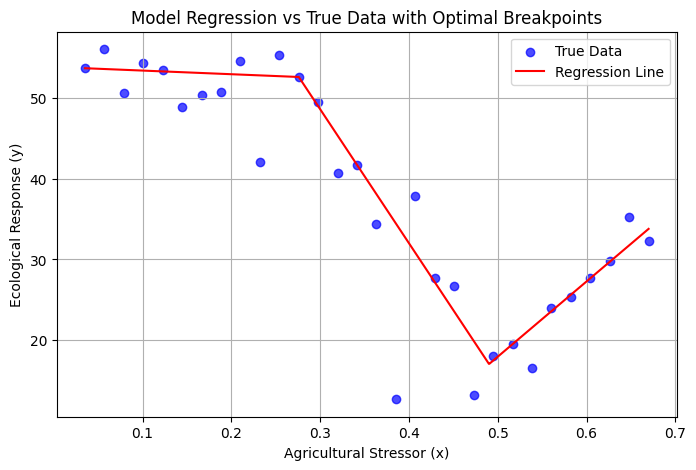

In [44]:
# update the check data
# df_check = simulation_data[simulation_data['(n, df)'] == '(30, 20)']

result, alphas, df_check = pqrm_pipeline(df_check, tau=0.5, initial_guess= (0.2, 0.45) , max_breakpoints=2, max_iter=50000)
print("Optimal breakpoints:", alphas)
print(result.summary())

# visualize the result 
plt.figure(figsize=(8, 5))
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Data', color='blue')
# Plot the regression line
# Use the continue predictor values in the space to predict
x_sorted = np.linspace(df_check['x'].min(), df_check['x'].max(), 1000)
x_break_sorted = [np.maximum(x_sorted - alpha, 0) for alpha in alphas]

y_pred = result.predict({'x': x_sorted, **{f'x_break{i+1}': x_break_sorted[i] for i in range(len(x_break_sorted))}})
plt.plot(x_sorted, y_pred, color='red', label='Regression Line')
# Add labels and legend
plt.xlabel('Agricultural Stressor (x)')
plt.ylabel('Ecological Response (y)')
plt.title('Model Regression vs True Data with Optimal Breakpoints')
plt.legend()
plt.grid(True)
plt.show()

After building the PQRM pipeline, i can change the input dataset easily and get the PQRM results under different 
conditions - sample size, df, etc.

Now, i can design the bootstrap process with the bias correction for PQRM predicition, after that i can generate more potential observations and run the PQRM for 'B' times to get the empirical distribution of the PQRM parameters.


# Bootstrap with bias correction for PQRM prediction

Ways to achieve wild bootstrap residuals.

Each residual from the original PQRM prediction is normalized by such:

$
\tilde{e}_i = \hat{e}_i - \left\{\hat{f}(0)\right\}^{-1} h_i \psi_\tau(\hat{e}_i) \quad \text{for } i = 1, 2, \ldots, n
$

The set $\{\tilde{e_1}, \dots \tilde{e_n}\}$ becomes the normalized residual set for bootstrapping, which eliminated the bias of estimation.

## Design the "Wild bootstrap residuals" approach

In [45]:
import numpy as np
from statsmodels.nonparametric.kde import KDEUnivariate

def correct_quantile_residuals(residuals, X, tau=0.5):
    """
    Perform bias correction for quantile regression residuals.
    
    All these vector/matrix operaions are broadcasted for element-wise computation,
    not algebraic matrix operations.

    Parameters:
    - residuals: numpy array of raw residuals (y - y_hat)
    - X: numpy array of shape (n_samples, n_features), only uses first column for leverage
    - tau: quantile level (e.g., 0.5 for median)

    Returns:
    - corrected_residuals: numpy array of bias-corrected residuals
    """
    n = len(residuals)
    
    # Estimate f(0): density of residuals at 0 using KDE
    kde = KDEUnivariate(residuals)
    kde.fit()
    f_0 = kde.evaluate(0)[0]  # density at 0

    # Compute leverage for each observation
    x_flat = X[:, 0] if X.ndim > 1 else X
    h = x_flat ** 2 / np.sum(x_flat ** 2)

    # Compute ψ_tau
    psi = tau - (residuals < 0).astype(float)

    # Bias-corrected residuals
    corrected = residuals - (1 / f_0) * h * psi

    return corrected

In [46]:
# Test on an example residuals 
residuals = np.random.normal(0, 1, 100)
X = np.random.rand(100, 1)  # Example feature matrix with one feature
corrected_residuals = correct_quantile_residuals(residuals, X, tau=0.5)
corrected_residuals[:5]

array([ 0.50090314, -0.94497098,  0.06211083,  0.73770501, -1.64861397])

In [47]:
%%time
# Prepare a fitted PQRM to get original residuals
tau = 0.5
df_check = simulation_data[simulation_data['(n, df)'] == '(150, 20)'].copy()
result, alphas, df_check = pqrm_pipeline(df_check, tau=tau, initial_guess= (0.2, 0.45) , max_breakpoints=2, max_iter=50000)

CPU times: user 2.26 s, sys: 48.5 ms, total: 2.31 s
Wall time: 2.71 s


In [48]:
# Extract the residuals
residuals = result.resid
# Correct the residuals
corrected_residuals = correct_quantile_residuals(residuals, df_check[['x']].values, tau=tau)

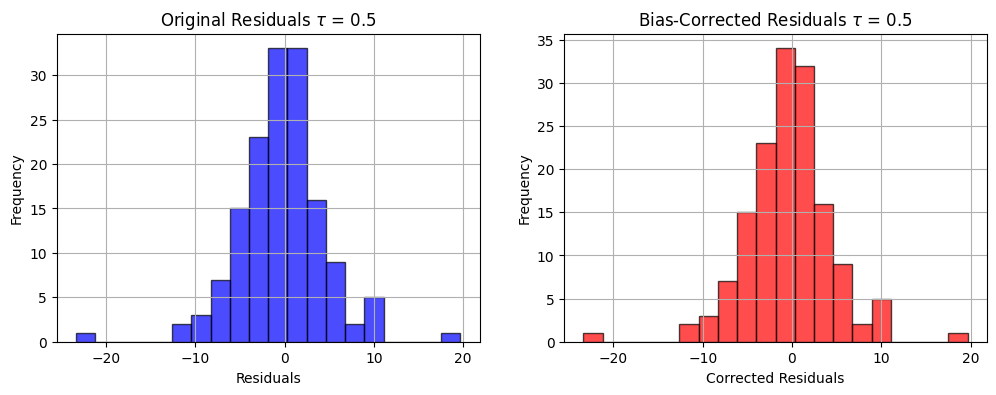

In [49]:
# Visualize the original and corrected residuals
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.hist(residuals, bins=20, alpha=0.7, color='blue', edgecolor='black')
plt.title(f'Original Residuals $\\tau$ = {tau}')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.hist(corrected_residuals, bins=20, alpha=0.7, color='red', edgecolor='black')
plt.title(f'Bias-Corrected Residuals $\\tau$ = {tau}')
plt.xlabel('Corrected Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

By visualization, the bias-corrected residuals are centered around zero, which is a good sign for the bootstrap process.

And it is a good sign that the PQRM result is not bad.

## Generate bootstrap residuals

These bootstrap residuals come from the normalized residuals by "Wild bootstrap residuals" approach.

After generating the bootstrap residuals, i can **add them to the original PQRM prediction to get the new dataset.**

Then, i can **run the PQRM on this new dataset** and get the new parameters.

In [50]:
def bootstrap_sample(data, n_samples=None, random_state=None):
    """
    Generate a bootstrap sample (with replacement) from a pandas Series or DataFrame.

    Parameters:
    - data: pd.Series or pd.DataFrame
    - n_samples: Number of samples to draw. If None, defaults to len(data)
    - random_state: Optional integer for reproducibility

    Returns:
    - A bootstrap resample (same type as input)
    """
    if n_samples is None:
        n_samples = len(data)

    rng = np.random.default_rng(random_state)
    indices = rng.integers(0, len(data), size=n_samples)

    return data.iloc[indices]

In [51]:
# Apply the bootstrap function to the corrected residuals
n_bootstrap_samples = len(corrected_residuals)
bootstrapped_residuals = bootstrap_sample(pd.Series(corrected_residuals), n_samples=n_bootstrap_samples)

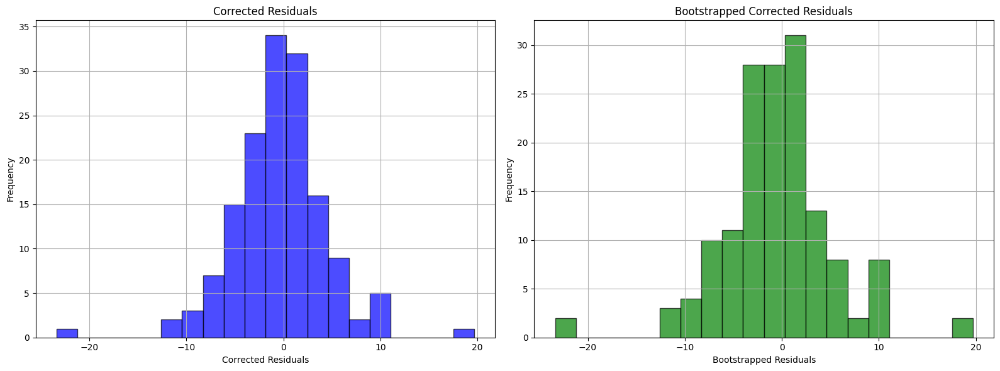

In [52]:
# Visualize the corrected residuals and the bootstrapped residuals
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot corrected residuals
axes[0].hist(corrected_residuals, bins=20, alpha=0.7, color='blue', edgecolor='black')
axes[0].set_title('Corrected Residuals')
axes[0].set_xlabel('Corrected Residuals')
axes[0].set_ylabel('Frequency')
axes[0].grid(True)

# Plot bootstrapped residuals
axes[1].hist(bootstrapped_residuals, bins=20, alpha=0.7, color='green', edgecolor='black')
axes[1].set_title('Bootstrapped Corrected Residuals')
axes[1].set_xlabel('Bootstrapped Residuals')
axes[1].set_ylabel('Frequency')
axes[1].grid(True)

plt.tight_layout()
plt.show()

In [53]:
# Add the bootstrapped residuals to predictions to get new response values
df_check['y_bootstrap'] = result.predict(df_check).values + bootstrapped_residuals.values # avoid the index matching operation
bootstrapped_residuals_no_correction = bootstrap_sample(pd.Series(residuals), n_samples=n_bootstrap_samples)
df_check['y_bootstrap_no_correction'] = result.predict(df_check).values + bootstrapped_residuals_no_correction.values # avoid the index matching operation

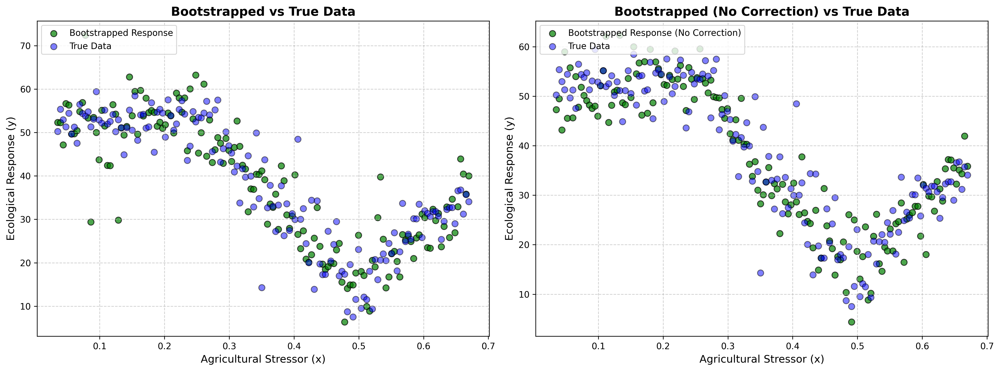

In [54]:
# Combine the two plots into one figure with two axes
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

# Plot bootstrapped response with correction
axes[0].scatter(df_check['x'], df_check['y_bootstrap'], alpha=0.7, label='Bootstrapped Response', color='green', edgecolor='black', s=50)
axes[0].scatter(df_check['x'], df_check['y_continuous'], alpha=0.5, label='True Data', color='blue', edgecolor='black', s=50)
axes[0].set_title('Bootstrapped vs True Data', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Agricultural Stressor (x)', fontsize=12)
axes[0].set_ylabel('Ecological Response (y)', fontsize=12)
axes[0].legend(loc='upper left', fontsize=10)
axes[0].grid(True, linestyle='--', alpha=0.6)

# Plot bootstrapped response without correction
axes[1].scatter(df_check['x'], df_check['y_bootstrap_no_correction'], alpha=0.7, label='Bootstrapped Response (No Correction)', color='green', edgecolor='black', s=50)
axes[1].scatter(df_check['x'], df_check['y_continuous'], alpha=0.5, label='True Data', color='blue', edgecolor='black', s=50)
axes[1].set_title('Bootstrapped (No Correction) vs True Data', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Agricultural Stressor (x)', fontsize=12)
axes[1].set_ylabel('Ecological Response (y)', fontsize=12)
axes[1].legend(loc='upper left', fontsize=10)
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

Now, i can organize these components into a pipeline to generate new observations.

This pipeline **receives a set of residuals and a dataset**, correcting and bootstrapping the residuals, adding them back to the predictions to have **new observattions with original predictors but new response** - $(x_i, y^*_i)$

## Generate future observations

In [55]:
# update the check data
df_check = simulation_data[simulation_data['(n, df)'] == '(150, 20)']
fitted_model, alphas, df_check = pqrm_pipeline(df_check, tau=0.5, initial_guess= (0.2, 0.45) , max_breakpoints=2, max_iter=50000)

In [56]:
# Generate potential future observations
def generate_future_observations(fitted_model, data, tau):
    """
    Generate future observations based on the fitted model and new data.
    
    Parameters:
    - fited_model: a PQRM fitted on the data
    - data: the same data but with breakpoint variables - "I(pmax(x - alpha_i, 0))", i = 1, ..., n
    - tau: quantile level for the regression, used for wild bootstrap
    
    Returns:
    - y_future: Predicted future observations
    """
    residuals = fitted_model.resid
    # Wild bootstrap residuals
    corrected_residuals = correct_quantile_residuals(residuals, data[['x']].values, tau=tau)
    
    # Bootstrap the bias-corrected residuals
    n_bootstrap_samples = len(data)
    bootstrapped_residuals = bootstrap_sample(pd.Series(corrected_residuals), n_samples=n_bootstrap_samples)
    
    # Original predictions
    y_pred = fitted_model.predict(data)
    
    # Add the bootstrapped residuals to the predictions to get new response values
    y_future = y_pred + bootstrapped_residuals.values  # avoid the index matching operation
    
    return y_future


In [57]:
df_check.loc[:, "y_bootstrap"] = generate_future_observations(fitted_model, df_check, tau=0.5)
df_check.head()

,x,y,y_continuous,e_i,e_i_star,error_scaling,"(n, df)",x_break1,x_break2,y_bootstrap
390,0.035100,50.263530,50.263530,-0.751492,-1.811261,0.414900,"(150, 20)",0.0,0.0,52.300842
391,0.039360,55.367626,55.367626,1.344457,3.274050,0.410640,"(150, 20)",0.0,0.0,58.903394
392,0.043619,52.954931,52.954931,0.342404,0.842569,0.406381,"(150, 20)",0.0,0.0,44.965917
393,0.047879,51.289549,51.289549,-0.338424,-0.841598,0.402121,"(150, 20)",0.0,0.0,44.828385
394,0.052139,54.436079,54.436079,0.909569,2.286146,0.397861,"(150, 20)",0.0,0.0,59.481819


In [58]:
# fit a new PQRM on the future observations
result_future, alphas_future, df_check_future = pqrm_pipeline(
    df_check, response_variable = "y_bootstrap", tau=0.5,  max_breakpoints=3, max_iter=50000)

print("Optimal breakpoints for future observations:", alphas_future)

Optimal breakpoints for future observations: [0.24666667 0.45823333 0.66975453]


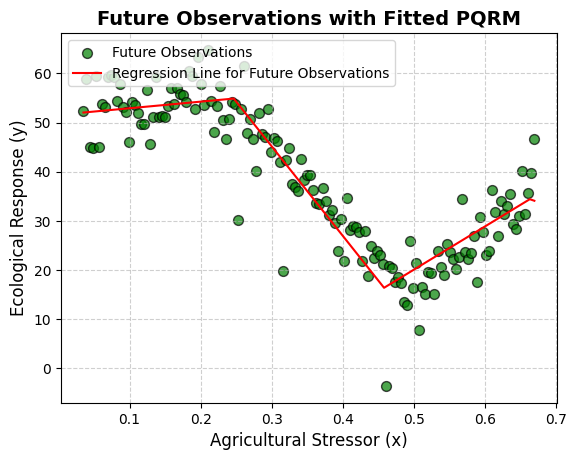

In [59]:
# Visualize the future observations and the fitted model
plt.figure()
plt.scatter(df_check['x'], df_check['y_bootstrap'], alpha=0.7, label='Future Observations', color='green', edgecolor='black', s=50)
# Plot the regression line for future observations
x_sorted = np.linspace(df_check['x'].min(), df_check['x'].max(), 100)
x_break_sorted = [np.maximum(x_sorted - alpha, 0) for alpha in alphas_future]
y_pred_future = result_future.predict({'x': x_sorted, **{f'x_break{i+1}': x_break_sorted[i] for i in range(len(x_break_sorted))}})
plt.plot(x_sorted, y_pred_future, color='red', label='Regression Line for Future Observations')
# Add labels and legend
plt.xlabel('Agricultural Stressor (x)', fontsize=12)
plt.ylabel('Ecological Response (y)', fontsize=12)
plt.title('Future Observations with Fitted PQRM', fontsize=14, fontweight='bold')
plt.legend(loc='upper left', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

## Repeat the fitting of PQRM for B times

Store the PQRM parameters for each bootstrap iteration, which provides empirical distributions.

In [60]:
%timeit
# Prepare the initial data and fitted model on it
df_check = simulation_data[simulation_data['(n, df)'] == '(150, 15)']
fitted_model, alphas, df_check = pqrm_pipeline(df_check, 
                                               tau=0.5,
                                               initial_guess= (0.2, 0.45), 
                                               bounds = [(0.2, 0.35), (0.4, 0.55)],
                                               max_iter=10000)
print(alphas)

[0.2651255 0.4898123]


In [61]:
%timeit
# Repeate the observation generation for B times
B = 50  # Number of bootstrap samples
bootstrap_predictions = dict()
bootstrap_alphas = dict()
df_check_new = df_check.copy()  # Create a new DataFrame to avoid modifying the original
for _ in range(B):
    y_future = generate_future_observations(fitted_model, df_check, tau=0.5)
    df_check_new.loc[:, "y_bootstrap"] = y_future
    # use new data to fit a new PQRM
    boot_model, boot_alphas, df_check_new = pqrm_pipeline(df_check_new, 
                                               tau=0.5,
                                               response_variable = "y_bootstrap",
                                               initial_guess= (0.2, 0.45), 
                                               bounds = [(0.2, 0.35), (0.4, 0.55)],
                                               max_iter=5000)
    # store the alphas for each new fitting
    bootstrap_predictions[_] = boot_model.predict(df_check_new)
    bootstrap_alphas[_] = boot_alphas

/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

KeyboardInterrupt: 

In [ ]:
# organize the bootstrap predictions into a DataFrame
bootstrap_predictions_df = pd.DataFrame(bootstrap_predictions)
bootstrap_predictions_df # each row represents all bootstrap predictions for a given x value
# Calculate the 95% confidence interval for each x value
bootstrap_ci_lower = bootstrap_predictions_df.quantile(0.025, axis=1)
bootstrap_ci_upper = bootstrap_predictions_df.quantile(0.975, axis=1)

In [ ]:
# organize the bootstrap alphas into a DataFrame
bootstrap_alphas_df = pd.DataFrame(bootstrap_alphas)
bootstrap_alphas_ci_lower = bootstrap_alphas_df.quantile(0.025, axis=1)
bootstrap_alphas_ci_upper = bootstrap_alphas_df.quantile(0.975, axis=1)
bootstrap_alphas_ci = list(zip(bootstrap_alphas_ci_lower, bootstrap_alphas_ci_upper))
bootstrap_alphas_ci

[(0.2365442860607575, 0.2897253557545209),
 (0.4874196894484798, 0.5144804908932592)]

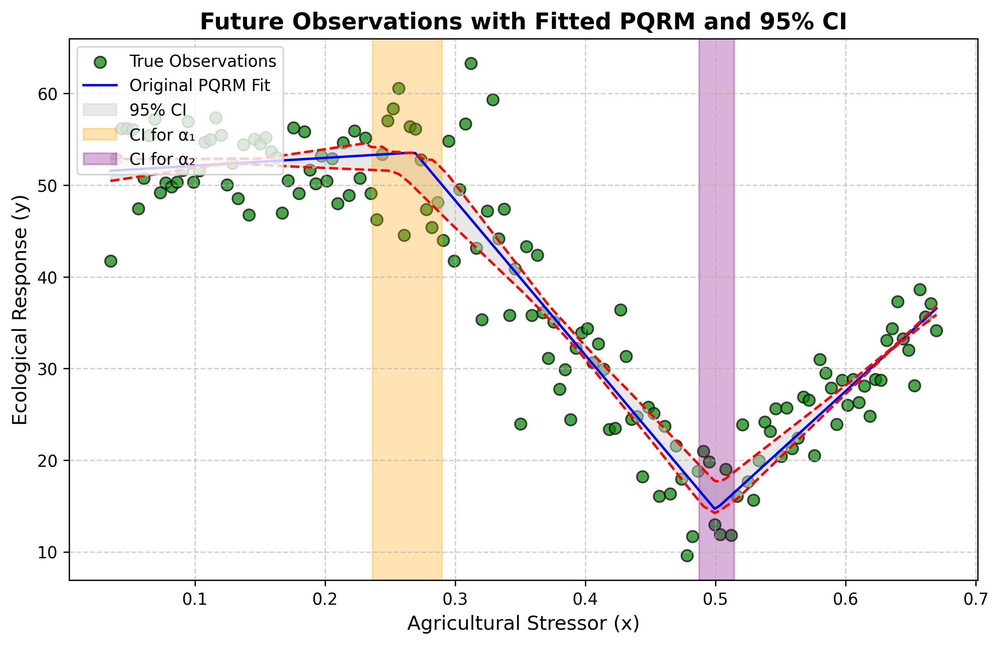

In [ ]:
# Plot the original data and the bootstrap confidence intervals
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
plt.scatter(df_check['x'], df_check['y_continuous'], alpha=0.7, label='True Observations', color='green', edgecolor='black', s=50)

# Plot the regression line for future observations
x_sorted = np.sort(df_check['x'])
x_break_sorted = [np.sort(df_check[f"x_break{i+1}"]) for i in range(len(alphas))]
y_pred_future = fitted_model.predict({'x': x_sorted, **{f'x_break{i+1}': x_break_sorted[i] for i in range(len(x_break_sorted))}})
plt.plot(x_sorted, y_pred_future, color='blue', label='Original PQRM Fit')

# Plot the confidence intervals for predictions
plt.fill_between(df_check['x'], bootstrap_ci_lower, bootstrap_ci_upper, color='lightgray', alpha=0.5, label='95% CI')
plt.plot(df_check['x'], bootstrap_ci_upper, color='red', linestyle='--')
plt.plot(df_check['x'], bootstrap_ci_lower, color='red', linestyle='--')

# Add vertical shaded regions for CIs
plt.axvspan(*bootstrap_alphas_ci[0], color='orange', alpha=0.3, label='CI for α₁')
plt.axvspan(*bootstrap_alphas_ci[1], color='purple', alpha=0.3, label='CI for α₂')

# Add labels and legend
plt.xlabel('Agricultural Stressor (x)', fontsize=12)
plt.ylabel('Ecological Response (y)', fontsize=12)
plt.title('Future Observations with Fitted PQRM and 95% CI', fontsize=14, fontweight='bold')
plt.legend(loc='upper left', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

## Package the above operations into a pipeline for different datasets

In [ ]:
def base_model(data, tau, initial_guess = None, bounds = None, max_iter = 5000):
    """
    Fit a base PQRM model to the original data.
    
    Parameters:
    - data: DataFrame containing 'x' and 'y_continuous'.
    - tau: Quantile level for regression.
    
    Returns:
    - result: Fitted model result.
    - alphas: Optimal breakpoints found.
    """
    fitted_model, alphas, data_with_alphas = pqrm_pipeline(data, tau=tau, initial_guess=initial_guess, bounds=bounds, max_iter=max_iter)
    return fitted_model, alphas, data_with_alphas

In [ ]:
def generate_empirical_parameters(B, fitted_model, data_with_alphas, 
                                  tau = 0.5, gamma = 0.95, initial_guess = None, bounds = None,
                                  max_iter = 5000):
    """
    Generate empirical parameters for the PQRM model.
    
    Parameters:
    - B: Number of bootstrap samples.
    - fitted_model: The base fitted model.
    - data_with_alphas: Data with breakpoint variables.
    - tau: Quantile level for regression.
    
    Returns:
    - bootstrap_predictions_df: DataFrame of bootstrap predictions.
    - bootstrap_alphas_df: DataFrame of bootstrap alphas.
    """
    bootstrap_predictions = dict()
    bootstrap_alphas = dict()
    data_with_alphas_bootstrap = data_with_alphas.copy()  # Create a new DataFrame to avoid modifying the original
    for _ in range(B):
        y_future = generate_future_observations(fitted_model, data_with_alphas_bootstrap, tau=tau)
        data_with_alphas_bootstrap.loc[:, "y_bootstrap"] = y_future
        # use new data to fit a new PQRM
        boot_model, boot_alphas, data_with_alphas_bootstrap = pqrm_pipeline(
                                               data_with_alphas_bootstrap, 
                                               tau=tau,
                                               response_variable = "y_bootstrap",
                                               initial_guess=initial_guess, 
                                               bounds=bounds,
                                               max_iter=max_iter)
        # store the alphas for each new fitting
        bootstrap_predictions[_] = boot_model.predict(data_with_alphas_bootstrap)
        bootstrap_alphas[_] = boot_alphas

    # organize the bootstrap predictions into a DataFrame
    bootstrap_predictions_df = pd.DataFrame(bootstrap_predictions)
    # Calculate the gamma confidence interval for each x value
    bootstrap_pred_ci_lower = bootstrap_predictions_df.quantile((1-gamma)/2, axis=1)
    bootstrap_pred_ci_upper = bootstrap_predictions_df.quantile((1+gamma)/2, axis=1)

    # organize the bootstrap alphas into a DataFrame
    bootstrap_alphas_df = pd.DataFrame(bootstrap_alphas)
    bootstrap_alphas_ci_lower = bootstrap_alphas_df.quantile((1-gamma)/2, axis=1)
    bootstrap_alphas_ci_upper = bootstrap_alphas_df.quantile((1+gamma)/2, axis=1)
    bootstrap_alphas_ci = list(zip(bootstrap_alphas_ci_lower, bootstrap_alphas_ci_upper))
    
    return (bootstrap_predictions_df, 
            (bootstrap_pred_ci_lower, 
             bootstrap_pred_ci_upper), 
            (bootstrap_alphas_ci_lower, 
             bootstrap_alphas_ci_upper), 
            bootstrap_alphas_ci)

### Watch out - for the initial parameters for base and bootstrap:

When fitting a base model, the initial parameters should be kept for the following empirical inference process, because such initial settings would determine the model performance in each training iteration.

A pair of different initial settings would lead to the final PQRM result very different, and the results from them would not be comparable.

A good practice is to use the same initial settings for both of the two procedures, 
saving them in local variables, instead of using them in the constructors.

In [ ]:
df_check = simulation_data[simulation_data['(n, df)'] == '(150, 15)'].copy()
# Base model and data preparation
fitted_model, alphas, data_with_alphas =  base_model(df_check, tau = 0.5, initial_guess= (0.2, 0.45), bounds = [(0.2, 0.35), (0.4, 0.55)], max_iter=5000)
# Generate empirical parameters
compound_results = generate_empirical_parameters(50, fitted_model, data_with_alphas, tau = 0.5, initial_guess= (0.2, 0.45), bounds = [(0.2, 0.35), (0.4, 0.55)], max_iter=5000)

/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

In [ ]:
# Visualize the bootstrap results with original data and fitted model

def plot_pqrm_with_bootstrap_results(df, data_with_alphas, fitted_model, alphas, result_tuple, gamma=0.95, tau = 0.5):
    """
    Plot PQRM regression fit with bootstrap confidence intervals and alpha CIs.
    
    Parameters:
    - df: DataFrame with 'x', 'y_continuous', and x_break columns
    - fitted_model: Fitted statsmodels quantile regression model
    - alphas: Breakpoint estimates
    - result_tuple: A tuple of outputs from a function that returns:
        (bootstrap_predictions_df, 
         (bootstrap_pred_ci_lower, bootstrap_pred_ci_upper), 
         (bootstrap_alphas_ci_lower, bootstrap_alphas_ci_upper), 
         bootstrap_alphas_ci)
    """
    bootstrap_predictions_df, (bootstrap_pred_ci_lower, bootstrap_pred_ci_upper), _, bootstrap_alphas_ci = result_tuple

    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

    # Scatter plot of true observations
    ax.scatter(df['x'], df['y_continuous'], alpha=0.7, label='True Observations', color='green', edgecolor='black', s=50)

    # Sorted x values
    x_sorted = np.linspace(df['x'].min(), df['x'].max(), 1000)
    x_break_sorted = [np.maximum(x_sorted - alpha, 0) for alpha in alphas]

    # Predict future observations
    x_break_dict = {f'x_break{i+1}': x_break_sorted[i] for i in range(len(x_break_sorted))}
    y_pred_future = fitted_model.predict({'x': x_sorted, **x_break_dict})
    ax.plot(x_sorted, y_pred_future, color='blue', label='Original PQRM Fit')

    # Confidence interval shading and lines
    ax.fill_between(df['x'], bootstrap_pred_ci_lower, bootstrap_pred_ci_upper, color='lightgray', alpha=0.5, label=f'{gamma*100}% CI')
    ax.plot(df['x'], bootstrap_pred_ci_upper, color='red', linestyle='--')
    ax.plot(df['x'], bootstrap_pred_ci_lower, color='red', linestyle='--')

    # Vertical shaded regions for alpha confidence intervals
    ax.axvspan(*bootstrap_alphas_ci[0], color='orange', alpha=0.3, label=f'{gamma * 100}%CI for α₁')
    ax.axvspan(*bootstrap_alphas_ci[1], color='purple', alpha=0.3, label=f'{gamma * 100}%CI for α₂')

    # Labels and legend
    ax.set_xlabel('Agricultural Stressor (x)', fontsize=12)
    ax.set_ylabel('Ecological Response (y)', fontsize=12)
    B = len(bootstrap_predictions_df.columns)  # Number of bootstrap samples
    ax.set_title(f'Empirical Inference with Fitted PQRM($\\tau = {tau}$), {gamma*100}% CI and B = {B}', fontsize=14, fontweight='bold')
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.6)

    return fig, ax

(<Figure size 3000x1800 with 1 Axes>,
 <Axes: title={'center': 'Empirical Inference with Fitted PQRM($\\tau = 0.8$), 95.0% CI and B = 50'}, xlabel='Agricultural Stressor (x)', ylabel='Ecological Response (y)'>)

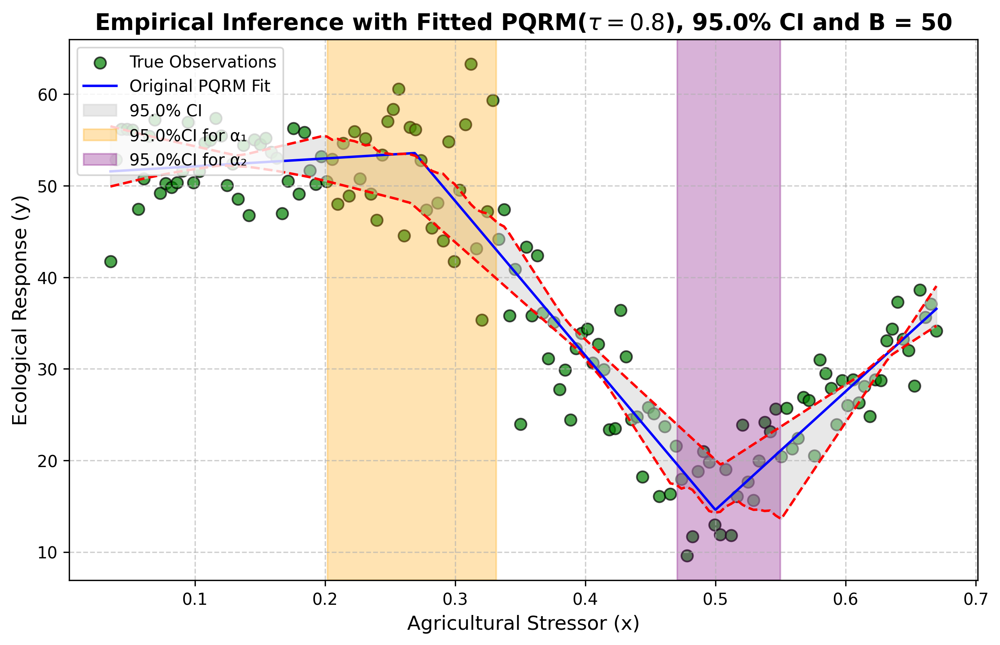

In [ ]:
# visualize the pipeline results
plot_pqrm_with_bootstrap_results(data_with_alphas, data_with_alphas, fitted_model, alphas, compound_results, tau = 0.8, gamma = 0.95)

## Iterate the PQRM pipeline for different datasets

In [ ]:
# Get unique (n, df) combinations from simulation_data already in memory
data_signs = simulation_data['(n, df)'].unique()
print(f"Available data configurations: {data_signs}")

/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

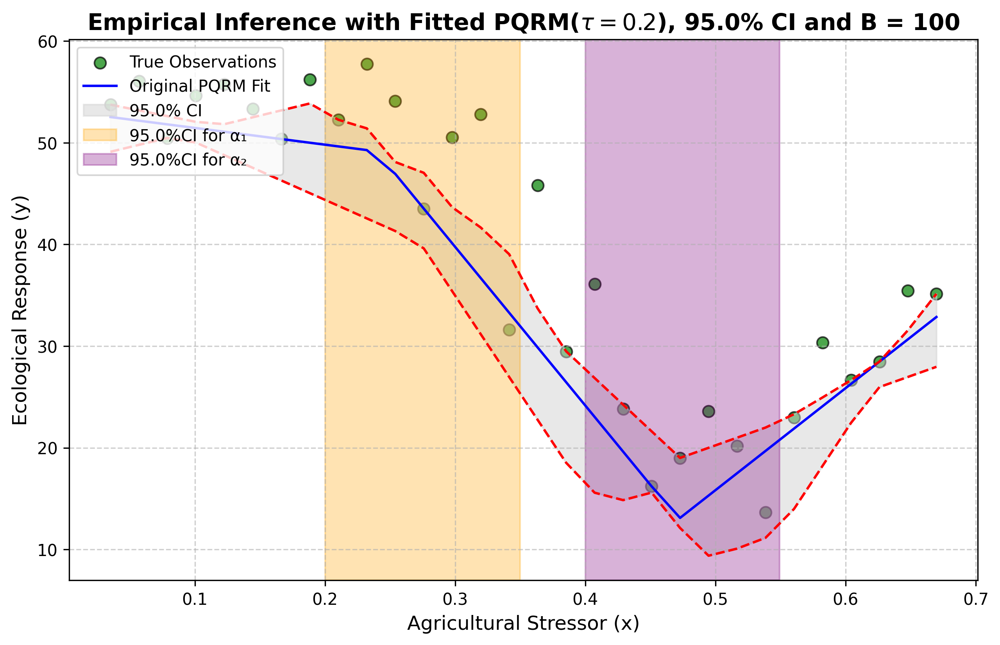

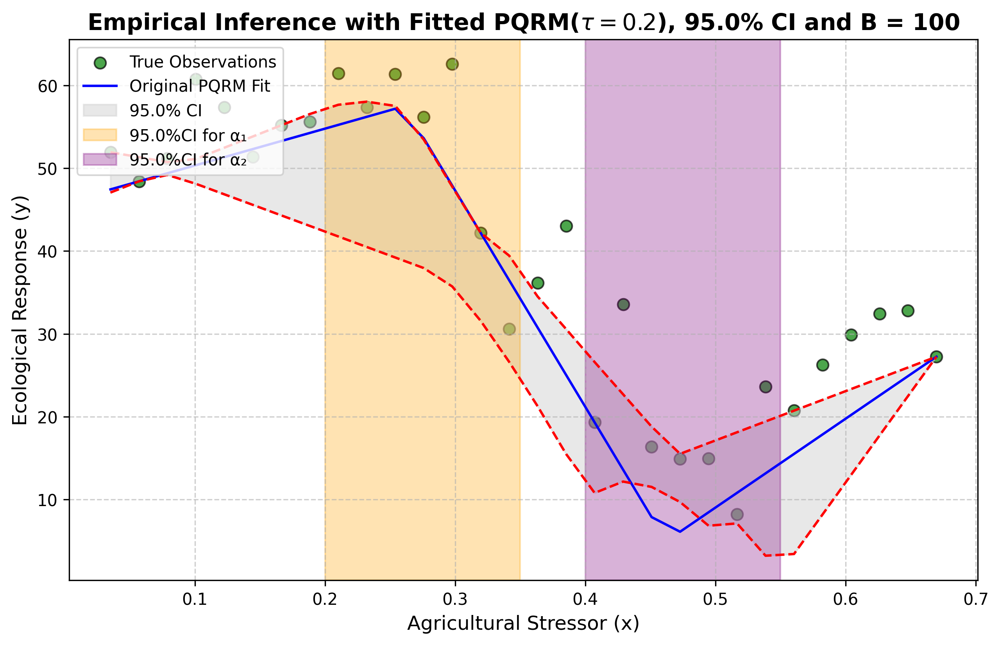

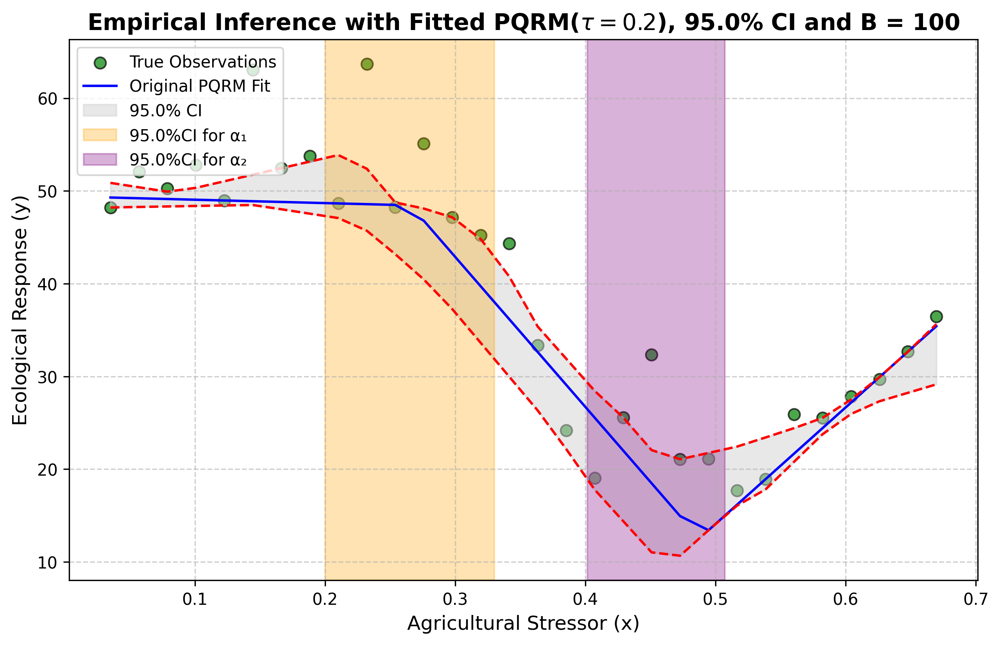

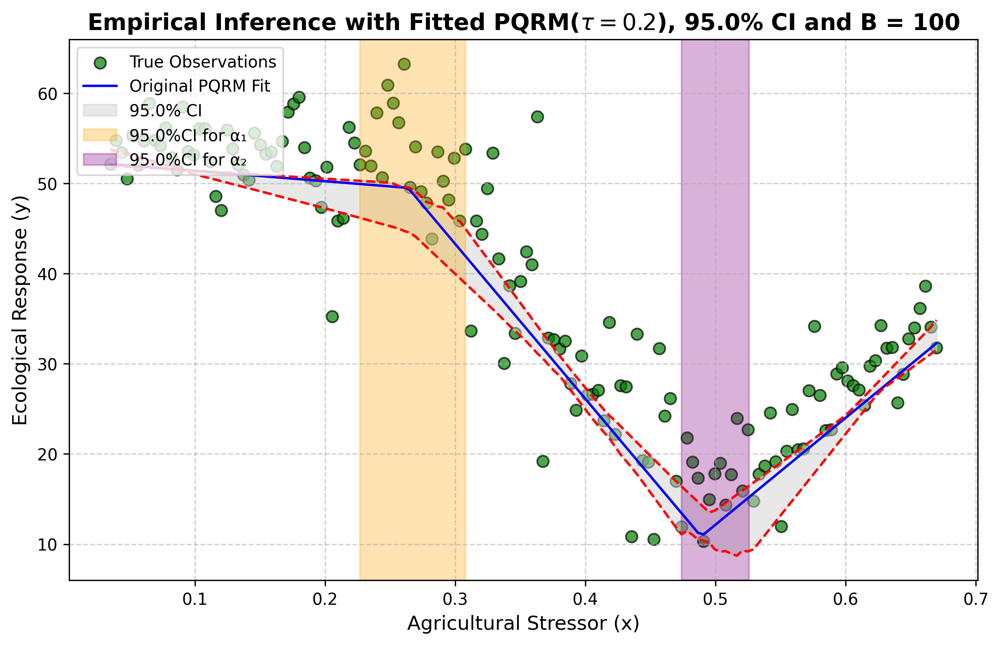

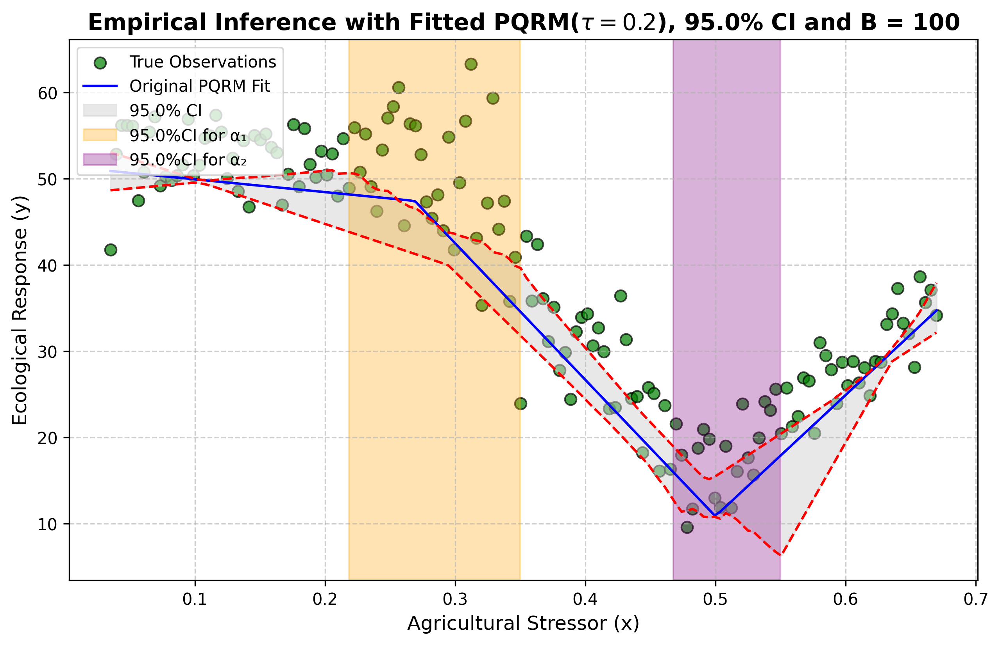

...

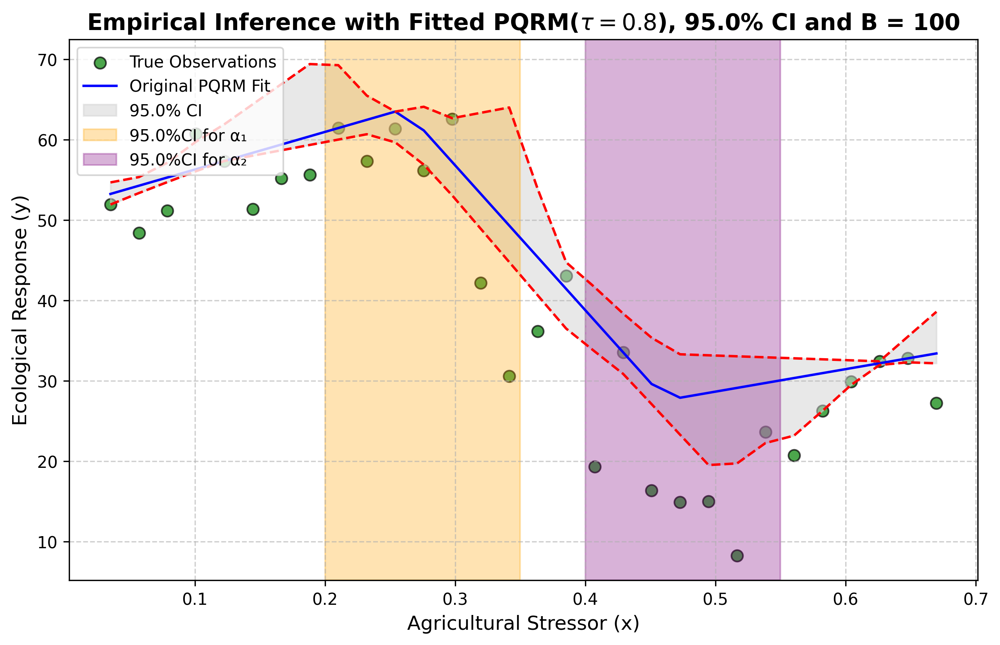

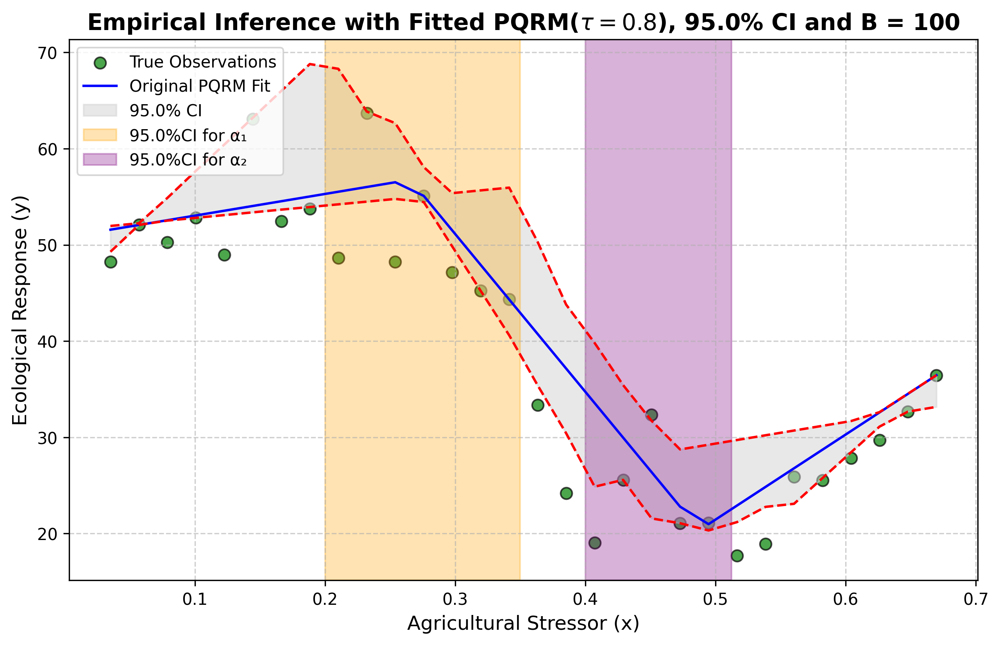

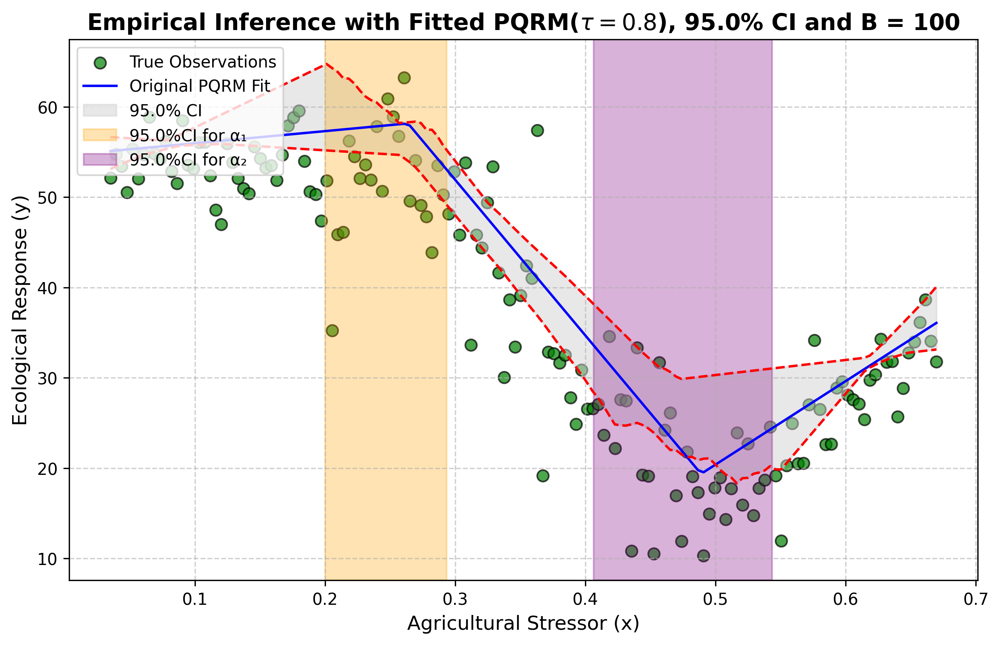

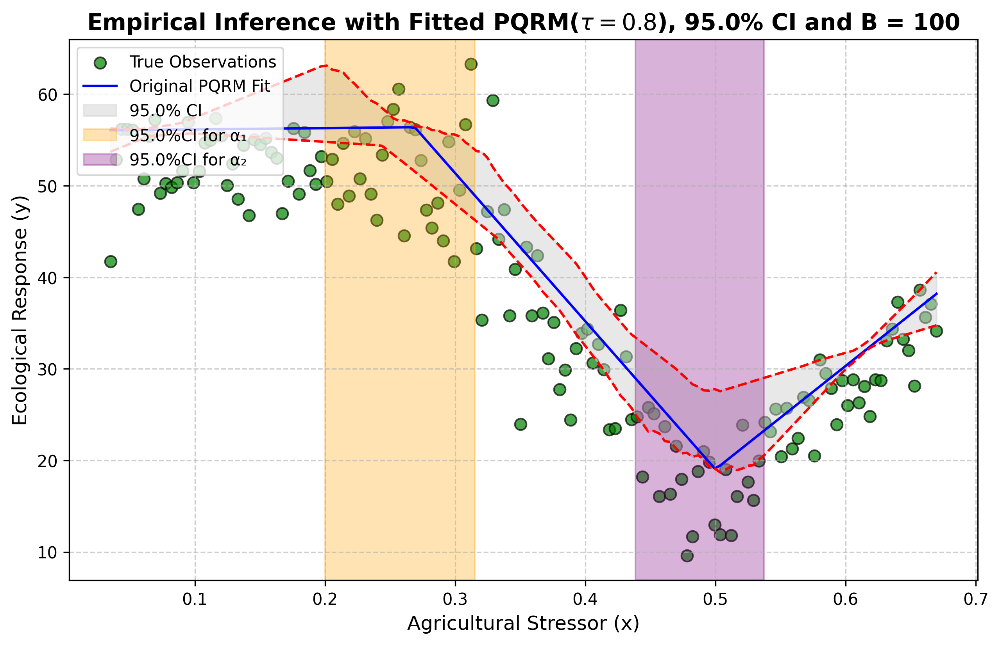

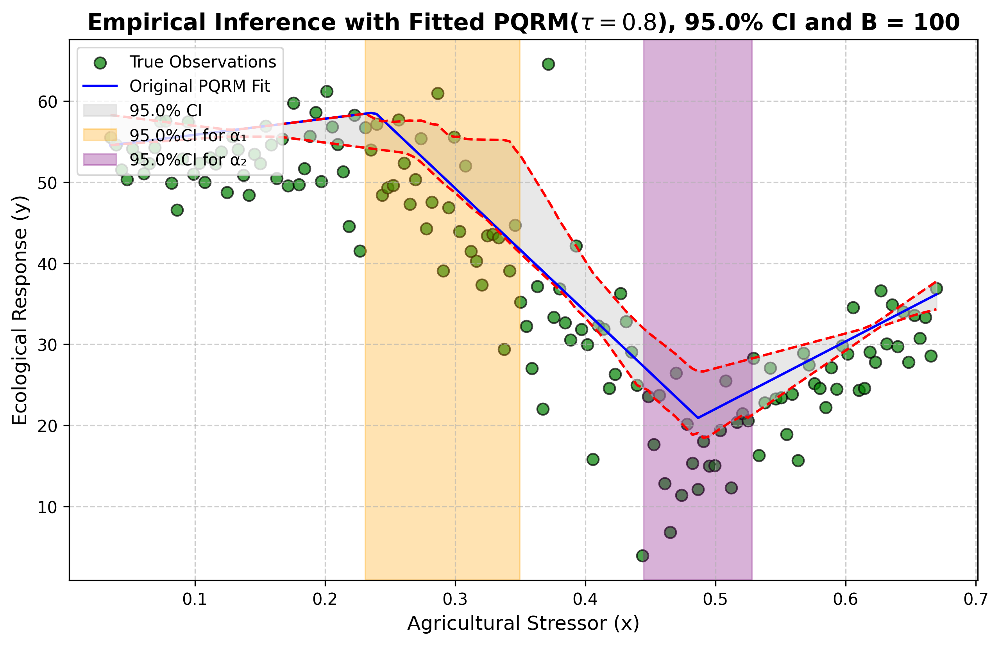

In [ ]:
%timeit
# itetrate over taus and data_signs to generate the results
taus = [0.2, 0.5, 0.8]
gamma = 0.90
B = 100
for tau in taus:
    for data_sign in data_signs:
        df_check = simulation_data[simulation_data['(n, df)'] == data_sign].copy()
        # Base model and data preparation
        fitted_model, alphas, data_with_alphas =  base_model(df_check, tau = tau, initial_guess= (0.2, 0.45), bounds = [(0.2, 0.35), (0.4, 0.55)], max_iter=5000)
        # Generate empirical parameters
        compound_results = generate_empirical_parameters(B, fitted_model, data_with_alphas, tau = tau, gamma = gamma, initial_guess= (0.2, 0.45), bounds = [(0.2, 0.35), (0.4, 0.55)], max_iter=5000)
        # visualize the pipeline results
        plot_pqrm_with_bootstrap_results(data_with_alphas, data_with_alphas, fitted_model, alphas, compound_results, tau = tau, gamma = 0.95)
        print(f"Completed: tau={tau}, data_sign={data_sign}")